In [114]:
import pandas as pd
import numpy as np
from sklearn import preprocessing
from sklearn.decomposition import PCA
import plotly.graph_objs as go
import plotly.offline as offline
offline.init_notebook_mode()
import matplotlib.pyplot as plt
import seaborn as sns

In [108]:
data = pd.read_csv("../data/data-307-genes.tsv", sep="\t")
X = data.iloc[:, 0:-1]
labels = data["Output"]
X.head()

,dvl2,crebbp,tead3,mlxipl,cntn1,wwtr1,fhl1,cul3,ros1,dkk3,...,dll1,mtor,notch4,akt1s1,psenen,lgr4,nras,mxd3,csnk1e,fntb
0,27.3175,35.9923,92.6269,0.2937,7.5341,130.1394,24.9828,29.5654,0.0145,17.3167,...,17.0359,27.1414,15.6237,42.9300,45.1770,27.4352,95.0655,5.8501,30.5683,5.0776
1,26.0353,54.3705,59.4532,0.9182,2.3824,22.7896,9.1206,31.8607,0.0184,23.3344,...,12.5204,28.1715,8.8192,35.1936,43.6791,10.9254,50.1929,3.1295,43.6371,8.7019
2,12.4058,23.6438,60.7730,7.7839,3.7291,51.0614,7.8421,19.7880,0.4622,33.8736,...,3.6698,22.4858,6.3690,22.6703,20.1549,25.6952,48.7956,5.2613,15.7701,5.9529
3,26.4100,42.6372,64.0893,1.2089,25.7382,43.2237,27.5472,26.9658,0.0748,54.1624,...,8.0997,23.6201,22.9036,38.1339,76.6666,7.7591,57.7607,3.1138,42.2439,10.3803
4,15.4519,27.8762,39.0321,0.4440,23.7083,42.1025,22.8243,29.8477,0.0401,9.7586,...,3.8486,29.8149,6.8445,45.3078,93.7323,25.5671,70.0726,2.1431,24.3090,5.8079


In [109]:
components = 5
pca = PCA(n_components=components)
Y = pca.fit(X)
var_exp = Y.explained_variance_ratio_
cum_var_exp = np.cumsum(var_exp)

In [110]:
# Plot the explained variance
x = ["PC%s" %i for i in range(1, components+1)]
trace1 = go.Bar(
    x=x,
    y=list(var_exp),
    name="Explained Variance")

trace2 = go.Scatter(
    x=x,
    y=cum_var_exp,
    name="Cumulative Variance")

layout = go.Layout(
    title='Explained variance',
    xaxis=dict(title='Principle Components', tickmode='linear'))

a = [trace1, trace2]
fig = go.Figure(data=a, layout=layout)
offline.iplot(fig)

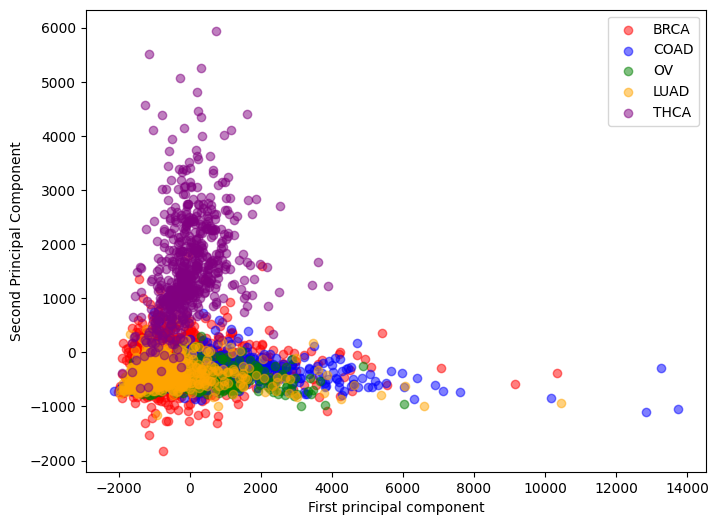

In [111]:
# Project first two components
model = PCA(n_components=2)
pcs = model.fit_transform(X)

# Get the indices of the respective cancer types.
le = preprocessing.LabelEncoder()
le.fit(labels) 
y = le.transform(labels) 
classes = le.classes_
max_ind = {}
for cancer in classes:
    max_ind[cancer] = max(data.index[data["Output"] == cancer].tolist())


# Plot the principal components.
plt.figure(figsize=(8,6))
plt.scatter(pcs[0:1230, 0], pcs[0:1230, 1], c="red", alpha=0.5, label="BRCA")
plt.scatter(pcs[1230:1754, 0], pcs[1230:1754, 1], c="blue", alpha=0.5, label="COAD")
plt.scatter(pcs[1754:2183, 0], pcs[1754:2183, 1], c="green", alpha=0.5, label="OV")
plt.scatter(pcs[2183:2783, 0], pcs[2183:2783, 1], c="orange", alpha=0.5, label="LUAD")
plt.scatter(pcs[2783:, 0], pcs[2783:, 1], c="purple", alpha=0.5, label="THCA")
plt.xlabel('First principal component')
plt.ylabel('Second Principal Component')
plt.legend()
plt.show()

In [128]:
X.corr()

c = X.corr()

s = c.unstack()
so = s.sort_values(kind="quicksort").to_frame()

for i,row in so.iterrows():
    print(row)


0   -0.423753
Name: (kat2b, cblc), dtype: float64
0   -0.423753
Name: (cblc, kat2b), dtype: float64
0   -0.40601
Name: (cblc, fzd1), dtype: float64
0   -0.40601
Name: (fzd1, cblc), dtype: float64
0   -0.402811
Name: (rapgef2, psenen), dtype: float64
0   -0.402811
Name: (psenen, rapgef2), dtype: float64
0   -0.393267
Name: (aph1b, dtx2), dtype: float64
0   -0.393267
Name: (dtx2, aph1b), dtype: float64
0   -0.375885
Name: (pik3r3, fzd5), dtype: float64
0   -0.375885
Name: (fzd5, pik3r3), dtype: float64
0   -0.373271
Name: (sav1, cblc), dtype: float64
0   -0.373271
Name: (cblc, sav1), dtype: float64
0   -0.368791
Name: (aph1b, cblc), dtype: float64
0   -0.368791
Name: (cblc, aph1b), dtype: float64
0   -0.361109
Name: (kat2b, frat2), dtype: float64
0   -0.361109
Name: (frat2, kat2b), dtype: float64
0   -0.357974
Name: (spred1, mxd3), dtype: float64
0   -0.357974
Name: (mxd3, spred1), dtype: float64
0   -0.355048
Name: (rictor, map2k2), dtype: float64
0   -0.355048
Name: (map2k2, rictor), d

0   -0.21181
Name: (wwtr1, dtx2), dtype: float64
0   -0.21181
Name: (dtx2, wwtr1), dtype: float64
0   -0.211795
Name: (cbl, rbx1), dtype: float64
0   -0.211795
Name: (rbx1, cbl), dtype: float64
0   -0.211672
Name: (eif4ebp1, sav1), dtype: float64
0   -0.211672
Name: (sav1, eif4ebp1), dtype: float64
0   -0.211556
Name: (fzd1, arrdc1), dtype: float64
0   -0.211556
Name: (arrdc1, fzd1), dtype: float64
0   -0.211537
Name: (taok3, wnt6), dtype: float64
0   -0.211537
Name: (wnt6, taok3), dtype: float64
0   -0.211529
Name: (dtx4, eif4ebp1), dtype: float64
0   -0.211529
Name: (eif4ebp1, dtx4), dtype: float64
0   -0.211368
Name: (inpp4b, dtx4), dtype: float64
0   -0.211368
Name: (dtx4, inpp4b), dtype: float64
0   -0.211347
Name: (rasgrf2, rfng), dtype: float64
0   -0.211347
Name: (rfng, rasgrf2), dtype: float64
0   -0.211231
Name: (e2f1, sos2), dtype: float64
0   -0.211231
Name: (sos2, e2f1), dtype: float64
0   -0.211175
Name: (fzd5, sfrp4), dtype: float64
0   -0.211175
Name: (sfrp4, fzd5), dty

0   -0.176116
Name: (pdk1, ppp2r1a), dtype: float64
0   -0.176116
Name: (ppp2r1a, pdk1), dtype: float64
0   -0.176114
Name: (spred1, ccne1), dtype: float64
0   -0.176114
Name: (ccne1, spred1), dtype: float64
0   -0.176105
Name: (sfrp2, ccnd3), dtype: float64
0   -0.176105
Name: (ccnd3, sfrp2), dtype: float64
0   -0.176069
Name: (rheb, inpp4b), dtype: float64
0   -0.176069
Name: (inpp4b, rheb), dtype: float64
0   -0.176038
Name: (akt2, dtx2), dtype: float64
0   -0.176038
Name: (dtx2, akt2), dtype: float64
0   -0.175991
Name: (pdgfra, hdac1), dtype: float64
0   -0.175991
Name: (hdac1, pdgfra), dtype: float64
0   -0.175987
Name: (lgr5, wnt7b), dtype: float64
0   -0.175987
Name: (wnt7b, lgr5), dtype: float64
0   -0.175973
Name: (wnt10a, arhgap35), dtype: float64
0   -0.175973
Name: (arhgap35, wnt10a), dtype: float64
0   -0.175969
Name: (cdkn2a, mlx), dtype: float64
0   -0.175969
Name: (mlx, cdkn2a), dtype: float64
0   -0.175963
Name: (eif4ebp1, mob1b), dtype: float64
0   -0.175963
Name: (m

0   -0.151049
Name: (rce1, shc2), dtype: float64
0   -0.150997
Name: (mxd4, fgfr4), dtype: float64
0   -0.150997
Name: (fgfr4, mxd4), dtype: float64
0   -0.150942
Name: (lgr5, wnt9a), dtype: float64
0   -0.150942
Name: (wnt9a, lgr5), dtype: float64
0   -0.150934
Name: (mlst8, cblb), dtype: float64
0   -0.150934
Name: (cblb, mlst8), dtype: float64
0   -0.150925
Name: (sos2, frat2), dtype: float64
0   -0.150925
Name: (frat2, sos2), dtype: float64
0   -0.150912
Name: (nrarp, spred3), dtype: float64
0   -0.150912
Name: (spred3, nrarp), dtype: float64
0   -0.15091
Name: (shoc2, e2f1), dtype: float64
0   -0.15091
Name: (e2f1, shoc2), dtype: float64
0   -0.150907
Name: (map2k2, rasgrp1), dtype: float64
0   -0.150907
Name: (rasgrp1, map2k2), dtype: float64
0   -0.150835
Name: (stk4, dtx4), dtype: float64
0   -0.150835
Name: (dtx4, stk4), dtype: float64
0   -0.150787
Name: (wtip, acvr1b), dtype: float64
0   -0.150787
Name: (acvr1b, wtip), dtype: float64
0   -0.150747
Name: (mxd3, irs1), dtype: 

0   -0.130914
Name: (arrdc1, rb1), dtype: float64
0   -0.130911
Name: (rit1, mlxip), dtype: float64
0   -0.130911
Name: (mlxip, rit1), dtype: float64
0   -0.130844
Name: (akt2, ros1), dtype: float64
0   -0.130844
Name: (ros1, akt2), dtype: float64
0   -0.13082
Name: (scrib, sfrp2), dtype: float64
0   -0.13082
Name: (sfrp2, scrib), dtype: float64
0   -0.130802
Name: (eif4ebp1, braf), dtype: float64
0   -0.130802
Name: (braf, eif4ebp1), dtype: float64
0   -0.130801
Name: (tle2, pik3r3), dtype: float64
0   -0.130801
Name: (pik3r3, tle2), dtype: float64
0   -0.130771
Name: (max, fzd5), dtype: float64
0   -0.130771
Name: (fzd5, max), dtype: float64
0   -0.130764
Name: (nf1, mlxipl), dtype: float64
0   -0.130764
Name: (mlxipl, nf1), dtype: float64
0   -0.130754
Name: (hey2, cblc), dtype: float64
0   -0.130754
Name: (cblc, hey2), dtype: float64
0   -0.130706
Name: (sap30, ros1), dtype: float64
0   -0.130706
Name: (ros1, sap30), dtype: float64
0   -0.130704
Name: (rictor, axin2), dtype: float6

0   -0.115579
Name: (porcn, nrarp), dtype: float64
0   -0.115579
Name: (nrarp, porcn), dtype: float64
0   -0.115553
Name: (crb3, hey1), dtype: float64
0   -0.115553
Name: (hey1, crb3), dtype: float64
0   -0.115546
Name: (fgfr4, wnt7b), dtype: float64
0   -0.115546
Name: (wnt7b, fgfr4), dtype: float64
0   -0.11552
Name: (cblb, fgfr4), dtype: float64
0   -0.11552
Name: (fgfr4, cblb), dtype: float64
0   -0.115516
Name: (numbl, rapgef2), dtype: float64
0   -0.115516
Name: (rapgef2, numbl), dtype: float64
0   -0.115512
Name: (hes4, ntrk2), dtype: float64
0   -0.115512
Name: (ntrk2, hes4), dtype: float64
0   -0.115509
Name: (jag1, rheb), dtype: float64
0   -0.115509
Name: (rheb, jag1), dtype: float64
0   -0.115505
Name: (hmcn1, akt1s1), dtype: float64
0   -0.115505
Name: (akt1s1, hmcn1), dtype: float64
0   -0.115497
Name: (ppp1ca, insr), dtype: float64
0   -0.115497
Name: (insr, ppp1ca), dtype: float64
0   -0.115493
Name: (wnt11, mapk1), dtype: float64
0   -0.115493
Name: (mapk1, wnt11), dty

0   -0.10208
Name: (akt1s1, mras), dtype: float64
0   -0.102073
Name: (tgfbr2, crb2), dtype: float64
0   -0.102073
Name: (crb2, tgfbr2), dtype: float64
0   -0.102065
Name: (fgfr4, dvl2), dtype: float64
0   -0.102065
Name: (dvl2, fgfr4), dtype: float64
0   -0.102059
Name: (dtx3l, lztr1), dtype: float64
0   -0.102059
Name: (lztr1, dtx3l), dtype: float64
0   -0.102058
Name: (ccnd2, fgfr1), dtype: float64
0   -0.102058
Name: (fgfr1, ccnd2), dtype: float64
0   -0.102046
Name: (fzd9, rasa1), dtype: float64
0   -0.102046
Name: (rasa1, fzd9), dtype: float64
0   -0.102045
Name: (crb2, mdm2), dtype: float64
0   -0.102045
Name: (mdm2, crb2), dtype: float64
0   -0.102006
Name: (ksr2, mxd1), dtype: float64
0   -0.102006
Name: (mxd1, ksr2), dtype: float64
0   -0.101968
Name: (rasgrp1, crb3), dtype: float64
0   -0.101968
Name: (crb3, rasgrp1), dtype: float64
0   -0.101964
Name: (cdkn1a, lgr5), dtype: float64
0   -0.101964
Name: (lgr5, cdkn1a), dtype: float64
0   -0.101888
Name: (rac1, fat4), dtype: f

0   -0.091016
Name: (lztr1, sos2), dtype: float64
0   -0.091016
Name: (sos2, lztr1), dtype: float64
0   -0.091016
Name: (rbx1, lats2), dtype: float64
0   -0.091016
Name: (lats2, rbx1), dtype: float64
0   -0.091007
Name: (adam17, cdkn1a), dtype: float64
0   -0.091007
Name: (cdkn1a, adam17), dtype: float64
0   -0.091
Name: (hipk2, rfng), dtype: float64
0   -0.091
Name: (rfng, hipk2), dtype: float64
0   -0.09096
Name: (hes2, kit), dtype: float64
0   -0.09096
Name: (kit, hes2), dtype: float64
0   -0.090959
Name: (dchs1, fzd5), dtype: float64
0   -0.090959
Name: (fzd5, dchs1), dtype: float64
0   -0.090954
Name: (ppp2r1a, fzd4), dtype: float64
0   -0.090954
Name: (fzd4, ppp2r1a), dtype: float64
0   -0.090947
Name: (ret, tcf7), dtype: float64
0   -0.090947
Name: (tcf7, ret), dtype: float64
0   -0.090937
Name: (lgr5, mdm2), dtype: float64
0   -0.090937
Name: (mdm2, lgr5), dtype: float64
0   -0.090927
Name: (rasal3, myc), dtype: float64
0   -0.090927
Name: (myc, rasal3), dtype: float64
0   -0.0

0   -0.080784
Name: (sfrp1, psenen), dtype: float64
0   -0.080784
Name: (psenen, sfrp1), dtype: float64
0   -0.080778
Name: (dchs2, fgfr4), dtype: float64
0   -0.080778
Name: (fgfr4, dchs2), dtype: float64
0   -0.08077
Name: (nprl3, fat1), dtype: float64
0   -0.08077
Name: (fat1, nprl3), dtype: float64
0   -0.080741
Name: (rbx1, gsk3b), dtype: float64
0   -0.080741
Name: (gsk3b, rbx1), dtype: float64
0   -0.080737
Name: (sos1, axin1), dtype: float64
0   -0.080737
Name: (axin1, sos1), dtype: float64
0   -0.080727
Name: (aph1b, mycn), dtype: float64
0   -0.080727
Name: (mycn, aph1b), dtype: float64
0   -0.080727
Name: (tsc1, wnt6), dtype: float64
0   -0.080727
Name: (wnt6, tsc1), dtype: float64
0   -0.080714
Name: (dll4, rasgrp1), dtype: float64
0   -0.080714
Name: (rasgrp1, dll4), dtype: float64
0   -0.080712
Name: (spred1, cdk4), dtype: float64
0   -0.080712
Name: (cdk4, spred1), dtype: float64
0   -0.080699
Name: (wnt11, rasa1), dtype: float64
0   -0.080699
Name: (rasa1, wnt11), dtype

0   -0.071148
Name: (dtx2, adam17), dtype: float64
0   -0.071138
Name: (mxd3, sfrp1), dtype: float64
0   -0.071138
Name: (sfrp1, mxd3), dtype: float64
0   -0.071132
Name: (cntn6, notch1), dtype: float64
0   -0.071132
Name: (notch1, cntn6), dtype: float64
0   -0.071118
Name: (znrf3, mfap5), dtype: float64
0   -0.071118
Name: (mfap5, znrf3), dtype: float64
0   -0.071105
Name: (mycn, lztr1), dtype: float64
0   -0.071105
Name: (lztr1, mycn), dtype: float64
0   -0.071089
Name: (egfl7, wnt2), dtype: float64
0   -0.071089
Name: (wnt2, egfl7), dtype: float64
0   -0.071083
Name: (kat2b, fat1), dtype: float64
0   -0.071083
Name: (fat1, kat2b), dtype: float64
0   -0.071079
Name: (kras, fzd1), dtype: float64
0   -0.071079
Name: (fzd1, kras), dtype: float64
0   -0.071074
Name: (fgfr4, ccnd1), dtype: float64
0   -0.071074
Name: (ccnd1, fgfr4), dtype: float64
0   -0.07107
Name: (mapk3, rapgef2), dtype: float64
0   -0.07107
Name: (rapgef2, mapk3), dtype: float64
0   -0.071067
Name: (fzd10, mfng), dtyp

0   -0.062533
Name: (tead4, irs1), dtype: float64
0   -0.062533
Name: (irs1, tead4), dtype: float64
0   -0.062521
Name: (numbl, rasgrp3), dtype: float64
0   -0.062521
Name: (rasgrp3, numbl), dtype: float64
0   -0.062499
Name: (erbb2, lgr4), dtype: float64
0   -0.062499
Name: (lgr4, erbb2), dtype: float64
0   -0.062491
Name: (ros1, amer1), dtype: float64
0   -0.062491
Name: (amer1, ros1), dtype: float64
0   -0.062482
Name: (rasa2, akt2), dtype: float64
0   -0.062482
Name: (akt2, rasa2), dtype: float64
0   -0.06247
Name: (mob1b, keap1), dtype: float64
0   -0.06247
Name: (keap1, mob1b), dtype: float64
0   -0.062468
Name: (mob1a, rbx1), dtype: float64
0   -0.062468
Name: (rbx1, mob1a), dtype: float64
0   -0.062463
Name: (wnt5b, fzd5), dtype: float64
0   -0.062463
Name: (fzd5, wnt5b), dtype: float64
0   -0.062462
Name: (mycl, ctnnb1), dtype: float64
0   -0.062462
Name: (ctnnb1, mycl), dtype: float64
0   -0.062392
Name: (mfap2, mdm2), dtype: float64
0   -0.062392
Name: (mdm2, mfap2), dtype: 

0   -0.053901
Name: (wnt10a, mras), dtype: float64
0   -0.05388
Name: (ppp2r1a, stk4), dtype: float64
0   -0.05388
Name: (stk4, ppp2r1a), dtype: float64
0   -0.053869
Name: (cdkn2a, erbb2), dtype: float64
0   -0.053869
Name: (erbb2, cdkn2a), dtype: float64
0   -0.053836
Name: (csnk1d, dchs2), dtype: float64
0   -0.053836
Name: (dchs2, csnk1d), dtype: float64
0   -0.053827
Name: (wwtr1, lztr1), dtype: float64
0   -0.053827
Name: (lztr1, wwtr1), dtype: float64
0   -0.053818
Name: (mapk3, rheb), dtype: float64
0   -0.053818
Name: (rheb, mapk3), dtype: float64
0   -0.053816
Name: (crb2, wnt10b), dtype: float64
0   -0.053816
Name: (wnt10b, crb2), dtype: float64
0   -0.053812
Name: (shc2, rasa2), dtype: float64
0   -0.053812
Name: (rasa2, shc2), dtype: float64
0   -0.053801
Name: (llgl2, egfr), dtype: float64
0   -0.053801
Name: (egfr, llgl2), dtype: float64
0   -0.053794
Name: (dtx4, mtor), dtype: float64
0   -0.053794
Name: (mtor, dtx4), dtype: float64
0   -0.053792
Name: (rce1, dll4), dty

0   -0.045578
Name: (mapk3, wnt5b), dtype: float64
0   -0.045578
Name: (wnt5b, mapk3), dtype: float64
0   -0.045578
Name: (kdm5a, mxd4), dtype: float64
0   -0.045578
Name: (mxd4, kdm5a), dtype: float64
0   -0.045575
Name: (wwc1, psen2), dtype: float64
0   -0.045575
Name: (psen2, wwc1), dtype: float64
0   -0.045551
Name: (dab2ip, rce1), dtype: float64
0   -0.045551
Name: (rce1, dab2ip), dtype: float64
0   -0.045549
Name: (grb2, ccnd3), dtype: float64
0   -0.045549
Name: (ccnd3, grb2), dtype: float64
0   -0.045539
Name: (ntrk2, wnt10b), dtype: float64
0   -0.045539
Name: (wnt10b, ntrk2), dtype: float64
0   -0.045536
Name: (ptpn11, mlxipl), dtype: float64
0   -0.045536
Name: (mlxipl, ptpn11), dtype: float64
0   -0.045496
Name: (nprl2, fzd9), dtype: float64
0   -0.045496
Name: (fzd9, nprl2), dtype: float64
0   -0.045486
Name: (hes2, hey1), dtype: float64
0   -0.045486
Name: (hey1, hes2), dtype: float64
0   -0.045484
Name: (map2k2, shc3), dtype: float64
0   -0.045484
Name: (shc3, map2k2), d

0   -0.038083
Name: (crb3, ntrk2), dtype: float64
0   -0.038083
Name: (ntrk2, crb3), dtype: float64
0   -0.038073
Name: (mlxipl, rapgef2), dtype: float64
0   -0.038073
Name: (rapgef2, mlxipl), dtype: float64
0   -0.038069
Name: (rasgrp2, mlx), dtype: float64
0   -0.038069
Name: (mlx, rasgrp2), dtype: float64
0   -0.038063
Name: (rbx1, pik3cb), dtype: float64
0   -0.038063
Name: (pik3cb, rbx1), dtype: float64
0   -0.038061
Name: (cdkn2c, spred2), dtype: float64
0   -0.038061
Name: (spred2, cdkn2c), dtype: float64
0   -0.038047
Name: (fzd3, rasgrf2), dtype: float64
0   -0.038047
Name: (rasgrf2, fzd3), dtype: float64
0   -0.038047
Name: (spred2, rbx1), dtype: float64
0   -0.038047
Name: (rbx1, spred2), dtype: float64
0   -0.03804
Name: (mob1a, mxd3), dtype: float64
0   -0.03804
Name: (mxd3, mob1a), dtype: float64
0   -0.038039
Name: (shc3, stk3), dtype: float64
0   -0.038039
Name: (stk3, shc3), dtype: float64
0   -0.038029
Name: (rfng, mlxip), dtype: float64
0   -0.038029
Name: (mlxip, rf

0   -0.030398
Name: (thbs2, hras), dtype: float64
0   -0.030392
Name: (rasal2, frat1), dtype: float64
0   -0.030392
Name: (frat1, rasal2), dtype: float64
0   -0.03039
Name: (mlst8, lrp6), dtype: float64
0   -0.03039
Name: (lrp6, mlst8), dtype: float64
0   -0.030387
Name: (wnt10b, pik3r3), dtype: float64
0   -0.030387
Name: (pik3r3, wnt10b), dtype: float64
0   -0.030378
Name: (plxnb1, fhl1), dtype: float64
0   -0.030378
Name: (fhl1, plxnb1), dtype: float64
0   -0.030374
Name: (wnt5b, ret), dtype: float64
0   -0.030374
Name: (ret, wnt5b), dtype: float64
0   -0.030371
Name: (taok3, lztr1), dtype: float64
0   -0.030371
Name: (lztr1, taok3), dtype: float64
0   -0.030368
Name: (taok1, mxd4), dtype: float64
0   -0.030368
Name: (mxd4, taok1), dtype: float64
0   -0.030364
Name: (rasa1, nprl3), dtype: float64
0   -0.030364
Name: (nprl3, rasa1), dtype: float64
0   -0.030362
Name: (mlxipl, egfr), dtype: float64
0   -0.030362
Name: (egfr, mlxipl), dtype: float64
0   -0.030343
Name: (axin1, rasgrp1)

0   -0.02323
Name: (mlxip, mob1b), dtype: float64
0   -0.023227
Name: (cdk4, deptor), dtype: float64
0   -0.023227
Name: (deptor, cdk4), dtype: float64
0   -0.023224
Name: (errfi1, sfrp4), dtype: float64
0   -0.023224
Name: (sfrp4, errfi1), dtype: float64
0   -0.02322
Name: (limd1, mapk3), dtype: float64
0   -0.02322
Name: (mapk3, limd1), dtype: float64
0   -0.023208
Name: (wnt10a, wnt9a), dtype: float64
0   -0.023208
Name: (wnt9a, wnt10a), dtype: float64
0   -0.023203
Name: (wnt4, cntn6), dtype: float64
0   -0.023203
Name: (cntn6, wnt4), dtype: float64
0   -0.023201
Name: (fgfr1, dab2ip), dtype: float64
0   -0.023201
Name: (dab2ip, fgfr1), dtype: float64
0   -0.02318
Name: (rasgrp2, pebp1), dtype: float64
0   -0.02318
Name: (pebp1, rasgrp2), dtype: float64
0   -0.023178
Name: (cblc, tle3), dtype: float64
0   -0.023178
Name: (tle3, cblc), dtype: float64
0   -0.023161
Name: (pdgfrb, ros1), dtype: float64
0   -0.023161
Name: (ros1, pdgfrb), dtype: float64
0   -0.023144
Name: (pea15, tcf7

0   -0.016876
Name: (fbxw7, lef1), dtype: float64
0   -0.016865
Name: (ajuba, e2f1), dtype: float64
0   -0.016865
Name: (e2f1, ajuba), dtype: float64
0   -0.016863
Name: (akt3, znrf3), dtype: float64
0   -0.016863
Name: (znrf3, akt3), dtype: float64
0   -0.01686
Name: (ccne1, mga), dtype: float64
0   -0.01686
Name: (mga, ccne1), dtype: float64
0   -0.016856
Name: (dkk2, tle1), dtype: float64
0   -0.016856
Name: (tle1, dkk2), dtype: float64
0   -0.016844
Name: (mfap2, mlxipl), dtype: float64
0   -0.016844
Name: (mlxipl, mfap2), dtype: float64
0   -0.01684
Name: (fgfr3, fzd7), dtype: float64
0   -0.01684
Name: (fzd7, fgfr3), dtype: float64
0   -0.016829
Name: (braf, rasgrp2), dtype: float64
0   -0.016829
Name: (rasgrp2, braf), dtype: float64
0   -0.01682
Name: (mapk3, ptpn11), dtype: float64
0   -0.01682
Name: (ptpn11, mapk3), dtype: float64
0   -0.016819
Name: (tle3, porcn), dtype: float64
0   -0.016819
Name: (porcn, tle3), dtype: float64
0   -0.016815
Name: (dll1, dchs2), dtype: float6

0   -0.010384
Name: (mras, hes1), dtype: float64
0   -0.010384
Name: (hes1, mras), dtype: float64
0   -0.010381
Name: (rasgrf1, igf1r), dtype: float64
0   -0.010381
Name: (igf1r, rasgrf1), dtype: float64
0   -0.010375
Name: (fzd10, mdm4), dtype: float64
0   -0.010375
Name: (mdm4, fzd10), dtype: float64
0   -0.010364
Name: (wwc1, erbb3), dtype: float64
0   -0.010364
Name: (erbb3, wwc1), dtype: float64
0   -0.010351
Name: (kdm5a, fhl1), dtype: float64
0   -0.010351
Name: (fhl1, kdm5a), dtype: float64
0   -0.01035
Name: (notch2, pebp1), dtype: float64
0   -0.01035
Name: (pebp1, notch2), dtype: float64
0   -0.01033
Name: (mycn, mfap5), dtype: float64
0   -0.01033
Name: (mfap5, mycn), dtype: float64
0   -0.010318
Name: (icmt, fzd3), dtype: float64
0   -0.010318
Name: (fzd3, icmt), dtype: float64
0   -0.010268
Name: (rasa1, mfng), dtype: float64
0   -0.010268
Name: (mfng, rasa1), dtype: float64
0   -0.010263
Name: (dchs2, cntn6), dtype: float64
0   -0.010263
Name: (cntn6, dchs2), dtype: floa

0   -0.004283
Name: (myc, grb2), dtype: float64
0   -0.004283
Name: (grb2, myc), dtype: float64
0   -0.004263
Name: (ctbp1, psen1), dtype: float64
0   -0.004263
Name: (psen1, ctbp1), dtype: float64
0   -0.004259
Name: (mxd4, tcf7l2), dtype: float64
0   -0.004259
Name: (tcf7l2, mxd4), dtype: float64
0   -0.004256
Name: (wnt6, wnt10b), dtype: float64
0   -0.004256
Name: (wnt10b, wnt6), dtype: float64
0   -0.004247
Name: (mxi1, kras), dtype: float64
0   -0.004247
Name: (kras, mxi1), dtype: float64
0   -0.004238
Name: (shc4, ppp2r1a), dtype: float64
0   -0.004238
Name: (ppp2r1a, shc4), dtype: float64
0   -0.004234
Name: (fzd8, hdac1), dtype: float64
0   -0.004234
Name: (hdac1, fzd8), dtype: float64
0   -0.004207
Name: (sav1, erbb2), dtype: float64
0   -0.004207
Name: (erbb2, sav1), dtype: float64
0   -0.004191
Name: (pik3r1, ncor2), dtype: float64
0   -0.004191
Name: (ncor2, pik3r1), dtype: float64
0   -0.00419
Name: (rps6, sav1), dtype: float64
0   -0.00419
Name: (sav1, rps6), dtype: floa

0    0.001875
Name: (hes2, pdgfrb), dtype: float64
0    0.001875
Name: (pdgfrb, hes2), dtype: float64
0    0.001878
Name: (ncor2, mfap5), dtype: float64
0    0.001878
Name: (mfap5, ncor2), dtype: float64
0    0.001884
Name: (hdac1, tead1), dtype: float64
0    0.001884
Name: (tead1, hdac1), dtype: float64
0    0.001902
Name: (dll1, scrib), dtype: float64
0    0.001902
Name: (scrib, dll1), dtype: float64
0    0.001903
Name: (araf, cntn6), dtype: float64
0    0.001903
Name: (cntn6, araf), dtype: float64
0    0.001911
Name: (cblc, dab2ip), dtype: float64
0    0.001911
Name: (dab2ip, cblc), dtype: float64
0    0.001913
Name: (tle3, scrib), dtype: float64
0    0.001913
Name: (scrib, tle3), dtype: float64
0    0.001918
Name: (fat2, keap1), dtype: float64
0    0.001918
Name: (keap1, fat2), dtype: float64
0    0.001934
Name: (wnt5b, cblb), dtype: float64
0    0.001934
Name: (cblb, wnt5b), dtype: float64
0    0.001947
Name: (wnt9a, wnt6), dtype: float64
0    0.001947
Name: (wnt6, wnt9a), dtype: 

0    0.00765
Name: (mnt, cdkn1a), dtype: float64
0    0.00765
Name: (cdkn1a, mnt), dtype: float64
0    0.007656
Name: (aph1a, dtx2), dtype: float64
0    0.007656
Name: (dtx2, aph1a), dtype: float64
0    0.007656
Name: (chek2, dll1), dtype: float64
0    0.007656
Name: (dll1, chek2), dtype: float64
0    0.007656
Name: (rce1, fgfr2), dtype: float64
0    0.007656
Name: (fgfr2, rce1), dtype: float64
0    0.00766
Name: (fzd5, rbpj), dtype: float64
0    0.00766
Name: (rbpj, fzd5), dtype: float64
0    0.007667
Name: (mapk1, lef1), dtype: float64
0    0.007667
Name: (lef1, mapk1), dtype: float64
0    0.007696
Name: (lrp5, fzd4), dtype: float64
0    0.007696
Name: (fzd4, lrp5), dtype: float64
0    0.0077
Name: (keap1, sos1), dtype: float64
0    0.0077
Name: (sos1, keap1), dtype: float64
0    0.007711
Name: (ccnd1, dll1), dtype: float64
0    0.007711
Name: (dll1, ccnd1), dtype: float64
0    0.007741
Name: (psen2, tp53), dtype: float64
0    0.007741
Name: (tp53, psen2), dtype: float64
0    0.00774

0    0.013503
Name: (hras, notch4), dtype: float64
0    0.013503
Name: (notch4, hras), dtype: float64
0    0.013505
Name: (akt1, egfr), dtype: float64
0    0.013505
Name: (egfr, akt1), dtype: float64
0    0.013512
Name: (sfrp1, psen1), dtype: float64
0    0.013512
Name: (psen1, sfrp1), dtype: float64
0    0.013513
Name: (ppp2r1a, ntrk1), dtype: float64
0    0.013513
Name: (ntrk1, ppp2r1a), dtype: float64
0    0.013515
Name: (axin1, heyl), dtype: float64
0    0.013515
Name: (heyl, axin1), dtype: float64
0    0.013524
Name: (rasal3, notch3), dtype: float64
0    0.013524
Name: (notch3, rasal3), dtype: float64
0    0.013529
Name: (axin1, fzd6), dtype: float64
0    0.013529
Name: (fzd6, axin1), dtype: float64
0    0.013538
Name: (fzd8, cdkn2a), dtype: float64
0    0.013538
Name: (cdkn2a, fzd8), dtype: float64
0    0.013551
Name: (nprl3, ntrk1), dtype: float64
0    0.013551
Name: (ntrk1, nprl3), dtype: float64
0    0.013558
Name: (skp1, mnt), dtype: float64
0    0.013558
Name: (mnt, skp1), d

0    0.019934
Name: (erf, fgfr4), dtype: float64
0    0.019939
Name: (rce1, inpp4b), dtype: float64
0    0.019939
Name: (inpp4b, rce1), dtype: float64
0    0.019944
Name: (acvr1b, atm), dtype: float64
0    0.019944
Name: (atm, acvr1b), dtype: float64
0    0.019951
Name: (dtx1, rasa2), dtype: float64
0    0.019951
Name: (rasa2, dtx1), dtype: float64
0    0.019953
Name: (mdm2, chd4), dtype: float64
0    0.019953
Name: (chd4, mdm2), dtype: float64
0    0.019956
Name: (rasgrp4, kit), dtype: float64
0    0.019956
Name: (kit, rasgrp4), dtype: float64
0    0.019963
Name: (chek2, psen1), dtype: float64
0    0.019963
Name: (psen1, chek2), dtype: float64
0    0.019966
Name: (ctnnb1, mlst8), dtype: float64
0    0.019966
Name: (mlst8, ctnnb1), dtype: float64
0    0.019976
Name: (dab2ip, notch3), dtype: float64
0    0.019976
Name: (notch3, dab2ip), dtype: float64
0    0.019978
Name: (psenen, hes1), dtype: float64
0    0.019978
Name: (hes1, psenen), dtype: float64
0    0.019988
Name: (psen2, dtx2), 

0    0.026108
Name: (igf1r, kras), dtype: float64
0    0.026108
Name: (kras, igf1r), dtype: float64
0    0.026111
Name: (fnta, znrf3), dtype: float64
0    0.026111
Name: (znrf3, fnta), dtype: float64
0    0.026122
Name: (rasa3, ntrk1), dtype: float64
0    0.026122
Name: (ntrk1, rasa3), dtype: float64
0    0.026124
Name: (erbb2, cblb), dtype: float64
0    0.026124
Name: (cblb, erbb2), dtype: float64
0    0.02613
Name: (maml3, notch1), dtype: float64
0    0.02613
Name: (notch1, maml3), dtype: float64
0    0.02614
Name: (plxnb1, wnt9a), dtype: float64
0    0.02614
Name: (wnt9a, plxnb1), dtype: float64
0    0.02614
Name: (mdm2, nprl2), dtype: float64
0    0.02614
Name: (nprl2, mdm2), dtype: float64
0    0.026152
Name: (hey1, eif4ebp1), dtype: float64
0    0.026152
Name: (eif4ebp1, hey1), dtype: float64
0    0.026159
Name: (dkk2, dvl3), dtype: float64
0    0.026159
Name: (dvl3, dkk2), dtype: float64
0    0.026166
Name: (tle3, fzd4), dtype: float64
0    0.026166
Name: (fzd4, tle3), dtype: fl

0    0.032064
Name: (rce1, wnt5b), dtype: float64
0    0.032064
Name: (wnt5b, rce1), dtype: float64
0    0.032071
Name: (fzd4, ajuba), dtype: float64
0    0.032071
Name: (ajuba, fzd4), dtype: float64
0    0.032083
Name: (ctbp2, mycl), dtype: float64
0    0.032083
Name: (mycl, ctbp2), dtype: float64
0    0.032087
Name: (pdk1, fgfr1), dtype: float64
0    0.032087
Name: (fgfr1, pdk1), dtype: float64
0    0.032097
Name: (dll1, rasgrp4), dtype: float64
0    0.032097
Name: (rasgrp4, dll1), dtype: float64
0    0.032106
Name: (mnt, ret), dtype: float64
0    0.032106
Name: (ret, mnt), dtype: float64
0    0.03211
Name: (wnt10b, abl1), dtype: float64
0    0.03211
Name: (abl1, wnt10b), dtype: float64
0    0.032114
Name: (abl1, nras), dtype: float64
0    0.032114
Name: (nras, abl1), dtype: float64
0    0.032115
Name: (taok3, fzd8), dtype: float64
0    0.032115
Name: (fzd8, taok3), dtype: float64
0    0.032118
Name: (dll4, rit1), dtype: float64
0    0.032118
Name: (rit1, dll4), dtype: float64
0    0

0    0.038418
Name: (fgfr2, taok2), dtype: float64
0    0.038418
Name: (taok2, fgfr2), dtype: float64
0    0.038467
Name: (akt2, grb2), dtype: float64
0    0.038467
Name: (grb2, akt2), dtype: float64
0    0.03847
Name: (tead3, sav1), dtype: float64
0    0.03847
Name: (sav1, tead3), dtype: float64
0    0.038479
Name: (acvr2a, ncor2), dtype: float64
0    0.038479
Name: (ncor2, acvr2a), dtype: float64
0    0.038481
Name: (tcf7l1, mlxip), dtype: float64
0    0.038481
Name: (mlxip, tcf7l1), dtype: float64
0    0.038497
Name: (dchs1, egfl7), dtype: float64
0    0.038497
Name: (egfl7, dchs1), dtype: float64
0    0.038504
Name: (mxi1, map2k1), dtype: float64
0    0.038504
Name: (map2k1, mxi1), dtype: float64
0    0.038505
Name: (hmcn1, ajuba), dtype: float64
0    0.038505
Name: (ajuba, hmcn1), dtype: float64
0    0.038512
Name: (mlxip, rce1), dtype: float64
0    0.038512
Name: (rce1, mlxip), dtype: float64
0    0.038515
Name: (araf, igf1r), dtype: float64
0    0.038515
Name: (igf1r, araf), dty

0    0.044542
Name: (dkk2, ccnd3), dtype: float64
0    0.044542
Name: (ccnd3, dkk2), dtype: float64
0    0.044544
Name: (rasal3, mdm4), dtype: float64
0    0.044544
Name: (mdm4, rasal3), dtype: float64
0    0.044547
Name: (amer1, fzd8), dtype: float64
0    0.044547
Name: (fzd8, amer1), dtype: float64
0    0.04455
Name: (nprl2, mycl), dtype: float64
0    0.04455
Name: (mycl, nprl2), dtype: float64
0    0.044579
Name: (rbx1, ret), dtype: float64
0    0.044579
Name: (ret, rbx1), dtype: float64
0    0.044579
Name: (pdgfra, fzd9), dtype: float64
0    0.044579
Name: (fzd9, pdgfra), dtype: float64
0    0.044592
Name: (mdm2, ajuba), dtype: float64
0    0.044592
Name: (ajuba, mdm2), dtype: float64
0    0.044616
Name: (notch3, ccnd1), dtype: float64
0    0.044616
Name: (ccnd1, notch3), dtype: float64
0    0.044617
Name: (numb, ret), dtype: float64
0    0.044617
Name: (ret, numb), dtype: float64
0    0.044617
Name: (notch1, shc3), dtype: float64
0    0.044617
Name: (shc3, notch1), dtype: float64


0    0.050761
Name: (irs2, csnk1d), dtype: float64
0    0.050768
Name: (tead4, mxd1), dtype: float64
0    0.050768
Name: (mxd1, tead4), dtype: float64
0    0.050787
Name: (wnt5a, dchs2), dtype: float64
0    0.050787
Name: (dchs2, wnt5a), dtype: float64
0    0.050787
Name: (rapgef2, igf1r), dtype: float64
0    0.050787
Name: (igf1r, rapgef2), dtype: float64
0    0.050789
Name: (psen1, tle2), dtype: float64
0    0.050789
Name: (tle2, psen1), dtype: float64
0    0.050799
Name: (egfl7, rasgrf2), dtype: float64
0    0.050799
Name: (rasgrf2, egfl7), dtype: float64
0    0.050823
Name: (kit, hey2), dtype: float64
0    0.050823
Name: (hey2, kit), dtype: float64
0    0.050833
Name: (fzd5, rasgrf1), dtype: float64
0    0.050833
Name: (rasgrf1, fzd5), dtype: float64
0    0.050849
Name: (mdm4, icmt), dtype: float64
0    0.050849
Name: (icmt, mdm4), dtype: float64
0    0.050868
Name: (znrf3, ppp1ca), dtype: float64
0    0.050868
Name: (ppp1ca, znrf3), dtype: float64
0    0.050869
Name: (fzd8, cdk2),

0    0.056579
Name: (pdgfrb, amer1), dtype: float64
0    0.056584
Name: (dll1, pten), dtype: float64
0    0.056584
Name: (pten, dll1), dtype: float64
0    0.056593
Name: (wnt4, spen), dtype: float64
0    0.056593
Name: (spen, wnt4), dtype: float64
0    0.056601
Name: (maml2, fgfr1), dtype: float64
0    0.056601
Name: (fgfr1, maml2), dtype: float64
0    0.056618
Name: (tead4, znrf3), dtype: float64
0    0.056618
Name: (znrf3, tead4), dtype: float64
0    0.056629
Name: (lgr4, hmcn1), dtype: float64
0    0.056629
Name: (hmcn1, lgr4), dtype: float64
0    0.056629
Name: (mxi1, pea15), dtype: float64
0    0.056629
Name: (pea15, mxi1), dtype: float64
0    0.056632
Name: (acvr1b, pik3cb), dtype: float64
0    0.056632
Name: (pik3cb, acvr1b), dtype: float64
0    0.056644
Name: (fzd5, tsc2), dtype: float64
0    0.056644
Name: (tsc2, fzd5), dtype: float64
0    0.056644
Name: (wnt6, cblc), dtype: float64
0    0.056644
Name: (cblc, wnt6), dtype: float64
0    0.056647
Name: (tgfbr2, wtip), dtype: flo

0    0.063033
Name: (scrib, spred3), dtype: float64
0    0.063053
Name: (shc3, spred3), dtype: float64
0    0.063053
Name: (spred3, shc3), dtype: float64
0    0.063053
Name: (ep300, erf), dtype: float64
0    0.063053
Name: (erf, ep300), dtype: float64
0    0.063077
Name: (akt1, tead1), dtype: float64
0    0.063077
Name: (tead1, akt1), dtype: float64
0    0.063089
Name: (deptor, araf), dtype: float64
0    0.063089
Name: (araf, deptor), dtype: float64
0    0.063089
Name: (rasgrf2, ajuba), dtype: float64
0    0.063089
Name: (ajuba, rasgrf2), dtype: float64
0    0.063103
Name: (mtor, hey1), dtype: float64
0    0.063103
Name: (hey1, mtor), dtype: float64
0    0.063126
Name: (maml1, porcn), dtype: float64
0    0.063126
Name: (porcn, maml1), dtype: float64
0    0.063135
Name: (crebbp, cdk4), dtype: float64
0    0.063135
Name: (cdk4, crebbp), dtype: float64
0    0.06314
Name: (raf1, dll4), dtype: float64
0    0.06314
Name: (dll4, raf1), dtype: float64
0    0.063146
Name: (dtx1, dvl1), dtype: f

0    0.069393
Name: (ptpn11, egfr), dtype: float64
0    0.0694
Name: (rasgrp2, notch1), dtype: float64
0    0.0694
Name: (notch1, rasgrp2), dtype: float64
0    0.069407
Name: (fzd4, mdm4), dtype: float64
0    0.069407
Name: (mdm4, fzd4), dtype: float64
0    0.069407
Name: (cdk2, wnt5b), dtype: float64
0    0.069407
Name: (wnt5b, cdk2), dtype: float64
0    0.069421
Name: (maml2, shc1), dtype: float64
0    0.069421
Name: (shc1, maml2), dtype: float64
0    0.069437
Name: (rac1, lgr5), dtype: float64
0    0.069437
Name: (lgr5, rac1), dtype: float64
0    0.069439
Name: (rasal2, acvr1b), dtype: float64
0    0.069439
Name: (acvr1b, rasal2), dtype: float64
0    0.069439
Name: (kat2b, rps6kb1), dtype: float64
0    0.069439
Name: (rps6kb1, kat2b), dtype: float64
0    0.069456
Name: (frat1, jak2), dtype: float64
0    0.069456
Name: (jak2, frat1), dtype: float64
0    0.069456
Name: (pik3r3, tead3), dtype: float64
0    0.069456
Name: (tead3, pik3r3), dtype: float64
0    0.069457
Name: (cdkn2c, eif4

0    0.075685
Name: (shc3, llgl1), dtype: float64
0    0.075685
Name: (llgl1, shc3), dtype: float64
0    0.075695
Name: (gsk3b, fzd2), dtype: float64
0    0.075695
Name: (fzd2, gsk3b), dtype: float64
0    0.075698
Name: (taok2, fzd7), dtype: float64
0    0.075698
Name: (fzd7, taok2), dtype: float64
0    0.075705
Name: (tp53, tcf7l1), dtype: float64
0    0.075705
Name: (tcf7l1, tp53), dtype: float64
0    0.07573
Name: (nfe2l2, pik3r3), dtype: float64
0    0.07573
Name: (pik3r3, nfe2l2), dtype: float64
0    0.075761
Name: (ksr1, mapkap1), dtype: float64
0    0.075761
Name: (mapkap1, ksr1), dtype: float64
0    0.075765
Name: (erf, aph1a), dtype: float64
0    0.075765
Name: (aph1a, erf), dtype: float64
0    0.075774
Name: (mycn, lrp5), dtype: float64
0    0.075774
Name: (lrp5, mycn), dtype: float64
0    0.075779
Name: (mras, rb1), dtype: float64
0    0.075779
Name: (rb1, mras), dtype: float64
0    0.075786
Name: (lgr4, araf), dtype: float64
0    0.075786
Name: (araf, lgr4), dtype: float64


0    0.082187
Name: (tp53, jag1), dtype: float64
0    0.082189
Name: (tle3, rbx1), dtype: float64
0    0.082189
Name: (rbx1, tle3), dtype: float64
0    0.082196
Name: (tle4, dll4), dtype: float64
0    0.082196
Name: (dll4, tle4), dtype: float64
0    0.082204
Name: (icmt, fgfr1), dtype: float64
0    0.082204
Name: (fgfr1, icmt), dtype: float64
0    0.082214
Name: (map2k1, tead4), dtype: float64
0    0.082214
Name: (tead4, map2k1), dtype: float64
0    0.082221
Name: (fzd6, fzd9), dtype: float64
0    0.082221
Name: (fzd9, fzd6), dtype: float64
0    0.082256
Name: (fntb, limd1), dtype: float64
0    0.082256
Name: (limd1, fntb), dtype: float64
0    0.082269
Name: (fzd8, lrp6), dtype: float64
0    0.082269
Name: (lrp6, fzd8), dtype: float64
0    0.082271
Name: (pea15, fgfr2), dtype: float64
0    0.082271
Name: (fgfr2, pea15), dtype: float64
0    0.082277
Name: (nras, shc4), dtype: float64
0    0.082277
Name: (shc4, nras), dtype: float64
0    0.082278
Name: (rb1, fzd7), dtype: float64
0    0.

0    0.088755
Name: (mras, dkk2), dtype: float64
0    0.088763
Name: (taok2, mlxip), dtype: float64
0    0.088763
Name: (mlxip, taok2), dtype: float64
0    0.088772
Name: (cdkn2a, cblc), dtype: float64
0    0.088772
Name: (cblc, cdkn2a), dtype: float64
0    0.088778
Name: (psenen, akt2), dtype: float64
0    0.088778
Name: (akt2, psenen), dtype: float64
0    0.088783
Name: (sfrp2, tle4), dtype: float64
0    0.088783
Name: (tle4, sfrp2), dtype: float64
0    0.088797
Name: (fzd9, pdk1), dtype: float64
0    0.088797
Name: (pdk1, fzd9), dtype: float64
0    0.088798
Name: (crb2, ppp1ca), dtype: float64
0    0.088798
Name: (ppp1ca, crb2), dtype: float64
0    0.088801
Name: (maml3, fzd10), dtype: float64
0    0.088801
Name: (fzd10, maml3), dtype: float64
0    0.088806
Name: (mxd1, errfi1), dtype: float64
0    0.088806
Name: (errfi1, mxd1), dtype: float64
0    0.088807
Name: (cntn6, llgl1), dtype: float64
0    0.088807
Name: (llgl1, cntn6), dtype: float64
0    0.088807
Name: (ksr1, mlx), dtype:

0    0.09522
Name: (psenen, wtip), dtype: float64
0    0.09522
Name: (wtip, psenen), dtype: float64
0    0.095226
Name: (tsc2, fnta), dtype: float64
0    0.095226
Name: (fnta, tsc2), dtype: float64
0    0.095229
Name: (fzd8, csnk1d), dtype: float64
0    0.095229
Name: (csnk1d, fzd8), dtype: float64
0    0.095233
Name: (akt2, crb2), dtype: float64
0    0.095233
Name: (crb2, akt2), dtype: float64
0    0.095251
Name: (crb2, notch3), dtype: float64
0    0.095251
Name: (notch3, crb2), dtype: float64
0    0.09528
Name: (kras, ccne1), dtype: float64
0    0.09528
Name: (ccne1, kras), dtype: float64
0    0.095301
Name: (wtip, tead2), dtype: float64
0    0.095301
Name: (tead2, wtip), dtype: float64
0    0.095314
Name: (akt1, lats2), dtype: float64
0    0.095314
Name: (lats2, akt1), dtype: float64
0    0.095348
Name: (dtx1, numbl), dtype: float64
0    0.095348
Name: (numbl, dtx1), dtype: float64
0    0.095361
Name: (mapk3, rps6), dtype: float64
0    0.095361
Name: (rps6, mapk3), dtype: float64
0 

0    0.101988
Name: (mxd4, lef1), dtype: float64
0    0.101988
Name: (lef1, mxd4), dtype: float64
0    0.101995
Name: (chek2, llgl1), dtype: float64
0    0.101995
Name: (llgl1, chek2), dtype: float64
0    0.101999
Name: (rasgrp3, cdkn1a), dtype: float64
0    0.101999
Name: (cdkn1a, rasgrp3), dtype: float64
0    0.102002
Name: (fntb, smad2), dtype: float64
0    0.102002
Name: (smad2, fntb), dtype: float64
0    0.102007
Name: (psenen, notch3), dtype: float64
0    0.102007
Name: (notch3, psenen), dtype: float64
0    0.102019
Name: (ncor2, myc), dtype: float64
0    0.102019
Name: (myc, ncor2), dtype: float64
0    0.102021
Name: (lats2, mdm2), dtype: float64
0    0.102021
Name: (mdm2, lats2), dtype: float64
0    0.102037
Name: (smad4, chd4), dtype: float64
0    0.102037
Name: (chd4, smad4), dtype: float64
0    0.102037
Name: (hes4, cblc), dtype: float64
0    0.102037
Name: (cblc, hes4), dtype: float64
0    0.102044
Name: (dtx4, braf), dtype: float64
0    0.102044
Name: (braf, dtx4), dtype: 

0    0.10913
Name: (mycl, dvl2), dtype: float64
0    0.10913
Name: (dvl2, mycl), dtype: float64
0    0.109136
Name: (rb1, csnk1d), dtype: float64
0    0.109136
Name: (csnk1d, rb1), dtype: float64
0    0.109142
Name: (wnt11, numbl), dtype: float64
0    0.109142
Name: (numbl, wnt11), dtype: float64
0    0.109152
Name: (mapk1, egfr), dtype: float64
0    0.109152
Name: (egfr, mapk1), dtype: float64
0    0.109154
Name: (icmt, notch1), dtype: float64
0    0.109154
Name: (notch1, icmt), dtype: float64
0    0.109159
Name: (ep300, erbb2), dtype: float64
0    0.109159
Name: (erbb2, ep300), dtype: float64
0    0.10917
Name: (wnt5b, shc1), dtype: float64
0    0.10917
Name: (shc1, wnt5b), dtype: float64
0    0.109181
Name: (mnt, hdac1), dtype: float64
0    0.109181
Name: (hdac1, mnt), dtype: float64
0    0.10919
Name: (fzd3, ccnd2), dtype: float64
0    0.10919
Name: (ccnd2, fzd3), dtype: float64
0    0.109198
Name: (mdm2, sav1), dtype: float64
0    0.109198
Name: (sav1, mdm2), dtype: float64
0    0

0    0.115898
Name: (fgfr3, mlst8), dtype: float64
0    0.115907
Name: (mfap5, cdkn2c), dtype: float64
0    0.115907
Name: (cdkn2c, mfap5), dtype: float64
0    0.115929
Name: (apc, tcf7l1), dtype: float64
0    0.115929
Name: (tcf7l1, apc), dtype: float64
0    0.115955
Name: (wwtr1, erf), dtype: float64
0    0.115955
Name: (erf, wwtr1), dtype: float64
0    0.115963
Name: (jag1, keap1), dtype: float64
0    0.115963
Name: (keap1, jag1), dtype: float64
0    0.115964
Name: (plxnb1, lztr1), dtype: float64
0    0.115964
Name: (lztr1, plxnb1), dtype: float64
0    0.115974
Name: (fzd5, rptor), dtype: float64
0    0.115974
Name: (rptor, fzd5), dtype: float64
0    0.11598
Name: (hmcn1, ntrk3), dtype: float64
0    0.11598
Name: (ntrk3, hmcn1), dtype: float64
0    0.115994
Name: (fnta, mdm2), dtype: float64
0    0.115994
Name: (mdm2, fnta), dtype: float64
0    0.116019
Name: (keap1, pik3cb), dtype: float64
0    0.116019
Name: (pik3cb, keap1), dtype: float64
0    0.116022
Name: (psen1, tle4), dtype:

0    0.122902
Name: (hey1, mxi1), dtype: float64
0    0.122904
Name: (rasgrp1, ncor2), dtype: float64
0    0.122904
Name: (ncor2, rasgrp1), dtype: float64
0    0.122916
Name: (taok2, fat4), dtype: float64
0    0.122916
Name: (fat4, taok2), dtype: float64
0    0.122942
Name: (csnk1d, rce1), dtype: float64
0    0.122942
Name: (rce1, csnk1d), dtype: float64
0    0.122958
Name: (hdac2, arhgap35), dtype: float64
0    0.122958
Name: (arhgap35, hdac2), dtype: float64
0    0.122959
Name: (cntn1, tle1), dtype: float64
0    0.122959
Name: (tle1, cntn1), dtype: float64
0    0.122969
Name: (tgfbr2, lrp5), dtype: float64
0    0.122969
Name: (lrp5, tgfbr2), dtype: float64
0    0.122971
Name: (cdk2, mdm4), dtype: float64
0    0.122971
Name: (mdm4, cdk2), dtype: float64
0    0.122973
Name: (yap1, max), dtype: float64
0    0.122973
Name: (max, yap1), dtype: float64
0    0.122976
Name: (dvl1, mxd3), dtype: float64
0    0.122976
Name: (mxd3, dvl1), dtype: float64
0    0.123007
Name: (cir1, cdkn1a), dtype

0    0.130759
Name: (ncstn, tp53), dtype: float64
0    0.130764
Name: (ctnnb1, rps6kb1), dtype: float64
0    0.130764
Name: (rps6kb1, ctnnb1), dtype: float64
0    0.130768
Name: (ksr1, heyl), dtype: float64
0    0.130768
Name: (heyl, ksr1), dtype: float64
0    0.130782
Name: (lrp6, nf2), dtype: float64
0    0.130782
Name: (nf2, lrp6), dtype: float64
0    0.130783
Name: (cdkn1b, ksr2), dtype: float64
0    0.130783
Name: (ksr2, cdkn1b), dtype: float64
0    0.130784
Name: (cdkn1b, rasa3), dtype: float64
0    0.130784
Name: (rasa3, cdkn1b), dtype: float64
0    0.130801
Name: (tp53, akt1), dtype: float64
0    0.130801
Name: (akt1, tp53), dtype: float64
0    0.130818
Name: (notch2, wnt2), dtype: float64
0    0.130818
Name: (wnt2, notch2), dtype: float64
0    0.130829
Name: (wnt4, ncor1), dtype: float64
0    0.130829
Name: (ncor1, wnt4), dtype: float64
0    0.130863
Name: (kdm5a, mxd1), dtype: float64
0    0.130863
Name: (mxd1, kdm5a), dtype: float64
0    0.130864
Name: (erbb3, sfrp4), dtype:

0    0.138369
Name: (wnt7b, sfrp4), dtype: float64
0    0.138369
Name: (sfrp4, wnt7b), dtype: float64
0    0.13837
Name: (fntb, abl1), dtype: float64
0    0.13837
Name: (abl1, fntb), dtype: float64
0    0.138371
Name: (ksr1, mtor), dtype: float64
0    0.138371
Name: (mtor, ksr1), dtype: float64
0    0.138375
Name: (nprl3, gsk3b), dtype: float64
0    0.138375
Name: (gsk3b, nprl3), dtype: float64
0    0.138388
Name: (snw1, hras), dtype: float64
0    0.138388
Name: (hras, snw1), dtype: float64
0    0.138402
Name: (numbl, dvl1), dtype: float64
0    0.138402
Name: (dvl1, numbl), dtype: float64
0    0.138405
Name: (kras, tsc1), dtype: float64
0    0.138405
Name: (tsc1, kras), dtype: float64
0    0.138424
Name: (arhgap35, plxnb1), dtype: float64
0    0.138424
Name: (plxnb1, arhgap35), dtype: float64
0    0.138464
Name: (wnt9a, map2k1), dtype: float64
0    0.138464
Name: (map2k1, wnt9a), dtype: float64
0    0.138486
Name: (dkk3, lrp6), dtype: float64
0    0.138486
Name: (lrp6, dkk3), dtype: fl

0    0.146189
Name: (ncor1, fzd4), dtype: float64
0    0.146189
Name: (fzd4, ncor1), dtype: float64
0    0.146191
Name: (rit1, max), dtype: float64
0    0.146191
Name: (max, rit1), dtype: float64
0    0.146235
Name: (wnt7b, numb), dtype: float64
0    0.146235
Name: (numb, wnt7b), dtype: float64
0    0.146241
Name: (rasgrf1, cntn6), dtype: float64
0    0.146241
Name: (cntn6, rasgrf1), dtype: float64
0    0.146252
Name: (akt2, akt1), dtype: float64
0    0.146252
Name: (akt1, akt2), dtype: float64
0    0.146271
Name: (sfrp1, ntrk2), dtype: float64
0    0.146271
Name: (ntrk2, sfrp1), dtype: float64
0    0.146278
Name: (rasgrp3, psen2), dtype: float64
0    0.146278
Name: (psen2, rasgrp3), dtype: float64
0    0.14628
Name: (fzd3, mycl), dtype: float64
0    0.14628
Name: (mycl, fzd3), dtype: float64
0    0.146294
Name: (rasgrp4, dtx3l), dtype: float64
0    0.146294
Name: (dtx3l, rasgrp4), dtype: float64
0    0.146296
Name: (nf2, braf), dtype: float64
0    0.146296
Name: (braf, nf2), dtype: fl

0    0.154183
Name: (fhl1, dll4), dtype: float64
0    0.154196
Name: (akt3, csnk1d), dtype: float64
0    0.154196
Name: (csnk1d, akt3), dtype: float64
0    0.154223
Name: (mxd4, depdc5), dtype: float64
0    0.154223
Name: (depdc5, mxd4), dtype: float64
0    0.154224
Name: (sos1, cdkn2c), dtype: float64
0    0.154224
Name: (cdkn2c, sos1), dtype: float64
0    0.154276
Name: (ntrk3, ncor1), dtype: float64
0    0.154276
Name: (ncor1, ntrk3), dtype: float64
0    0.154278
Name: (mfap2, cntn1), dtype: float64
0    0.154278
Name: (cntn1, mfap2), dtype: float64
0    0.154288
Name: (kdm5a, mfap5), dtype: float64
0    0.154288
Name: (mfap5, kdm5a), dtype: float64
0    0.154296
Name: (mycn, tsc2), dtype: float64
0    0.154296
Name: (tsc2, mycn), dtype: float64
0    0.154297
Name: (mob1a, maml3), dtype: float64
0    0.154297
Name: (maml3, mob1a), dtype: float64
0    0.154313
Name: (kras, psen1), dtype: float64
0    0.154313
Name: (psen1, kras), dtype: float64
0    0.154314
Name: (cir1, rac1), dtype

0    0.16239
Name: (wtip, notch2), dtype: float64
0    0.162399
Name: (fzd3, akt2), dtype: float64
0    0.162399
Name: (akt2, fzd3), dtype: float64
0    0.162404
Name: (ret, irs1), dtype: float64
0    0.162404
Name: (irs1, ret), dtype: float64
0    0.162413
Name: (lrp6, tgfbr2), dtype: float64
0    0.162413
Name: (tgfbr2, lrp6), dtype: float64
0    0.162418
Name: (cdkn1b, igf1r), dtype: float64
0    0.162418
Name: (igf1r, cdkn1b), dtype: float64
0    0.162428
Name: (mlxip, cbl), dtype: float64
0    0.162428
Name: (cbl, mlxip), dtype: float64
0    0.162458
Name: (heyl, jag2), dtype: float64
0    0.162458
Name: (jag2, heyl), dtype: float64
0    0.162464
Name: (smad4, dll1), dtype: float64
0    0.162464
Name: (dll1, smad4), dtype: float64
0    0.162466
Name: (lrp6, erbb4), dtype: float64
0    0.162466
Name: (erbb4, lrp6), dtype: float64
0    0.162467
Name: (sos1, nf2), dtype: float64
0    0.162467
Name: (nf2, sos1), dtype: float64
0    0.162475
Name: (akt2, chd8), dtype: float64
0    0.16

0    0.170797
Name: (pdgfra, shc1), dtype: float64
0    0.170797
Name: (shc1, pdgfra), dtype: float64
0    0.170809
Name: (nras, mga), dtype: float64
0    0.170809
Name: (mga, nras), dtype: float64
0    0.170815
Name: (mapk1, mlxip), dtype: float64
0    0.170815
Name: (mlxip, mapk1), dtype: float64
0    0.170815
Name: (cdkn1b, e2f3), dtype: float64
0    0.170815
Name: (e2f3, cdkn1b), dtype: float64
0    0.170818
Name: (irs2, fat1), dtype: float64
0    0.170818
Name: (fat1, irs2), dtype: float64
0    0.170846
Name: (csnk1d, crb3), dtype: float64
0    0.170846
Name: (crb3, csnk1d), dtype: float64
0    0.170849
Name: (limd1, mlx), dtype: float64
0    0.170849
Name: (mlx, limd1), dtype: float64
0    0.170851
Name: (rce1, crb2), dtype: float64
0    0.170851
Name: (crb2, rce1), dtype: float64
0    0.170854
Name: (cdk6, hmcn1), dtype: float64
0    0.170854
Name: (hmcn1, cdk6), dtype: float64
0    0.170861
Name: (numb, spred3), dtype: float64
0    0.170861
Name: (spred3, numb), dtype: float64


0    0.180205
Name: (limd1, lrp6), dtype: float64
0    0.180205
Name: (lrp6, limd1), dtype: float64
0    0.180207
Name: (map2k1, akt1), dtype: float64
0    0.180207
Name: (akt1, map2k1), dtype: float64
0    0.180254
Name: (notch2, lef1), dtype: float64
0    0.180254
Name: (lef1, notch2), dtype: float64
0    0.180273
Name: (sav1, akt1), dtype: float64
0    0.180273
Name: (akt1, sav1), dtype: float64
0    0.180309
Name: (itch, myc), dtype: float64
0    0.180309
Name: (myc, itch), dtype: float64
0    0.180315
Name: (deptor, spred1), dtype: float64
0    0.180315
Name: (spred1, deptor), dtype: float64
0    0.180321
Name: (nprl3, crb2), dtype: float64
0    0.180321
Name: (crb2, nprl3), dtype: float64
0    0.180354
Name: (dtx3l, smad4), dtype: float64
0    0.180354
Name: (smad4, dtx3l), dtype: float64
0    0.180363
Name: (fzd3, ep300), dtype: float64
0    0.180363
Name: (ep300, fzd3), dtype: float64
0    0.180376
Name: (fzd4, fbxw7), dtype: float64
0    0.180376
Name: (fbxw7, fzd4), dtype: fl

0    0.190247
Name: (rasa3, rbpj), dtype: float64
0    0.190247
Name: (rbpj, rasa3), dtype: float64
0    0.190254
Name: (thbs2, jag1), dtype: float64
0    0.190254
Name: (jag1, thbs2), dtype: float64
0    0.190311
Name: (mtor, chek2), dtype: float64
0    0.190311
Name: (chek2, mtor), dtype: float64
0    0.190318
Name: (insr, frat1), dtype: float64
0    0.190318
Name: (frat1, insr), dtype: float64
0    0.190362
Name: (sos1, ajuba), dtype: float64
0    0.190362
Name: (ajuba, sos1), dtype: float64
0    0.190394
Name: (mapkap1, akt3), dtype: float64
0    0.190394
Name: (akt3, mapkap1), dtype: float64
0    0.190395
Name: (tead3, keap1), dtype: float64
0    0.190395
Name: (keap1, tead3), dtype: float64
0    0.190397
Name: (ep300, lgr4), dtype: float64
0    0.190397
Name: (lgr4, ep300), dtype: float64
0    0.190401
Name: (fntb, dvl3), dtype: float64
0    0.190401
Name: (dvl3, fntb), dtype: float64
0    0.190406
Name: (tle2, tead1), dtype: float64
0    0.190406
Name: (tead1, tle2), dtype: floa

0    0.200859
Name: (mfap5, pik3r3), dtype: float64
0    0.20088
Name: (sav1, tle3), dtype: float64
0    0.20088
Name: (tle3, sav1), dtype: float64
0    0.200885
Name: (dab2ip, tead3), dtype: float64
0    0.200885
Name: (tead3, dab2ip), dtype: float64
0    0.200907
Name: (lrp6, snw1), dtype: float64
0    0.200907
Name: (snw1, lrp6), dtype: float64
0    0.20092
Name: (araf, mapkap1), dtype: float64
0    0.20092
Name: (mapkap1, araf), dtype: float64
0    0.200938
Name: (mnt, irs1), dtype: float64
0    0.200938
Name: (irs1, mnt), dtype: float64
0    0.200949
Name: (hipk2, dtx4), dtype: float64
0    0.200949
Name: (dtx4, hipk2), dtype: float64
0    0.200951
Name: (tead3, maml2), dtype: float64
0    0.200951
Name: (maml2, tead3), dtype: float64
0    0.201001
Name: (rasgrf2, tcf7l2), dtype: float64
0    0.201001
Name: (tcf7l2, rasgrf2), dtype: float64
0    0.20102
Name: (dkk3, icmt), dtype: float64
0    0.20102
Name: (icmt, dkk3), dtype: float64
0    0.201028
Name: (dll4, axin2), dtype: floa

0    0.211836
Name: (aph1b, llgl1), dtype: float64
0    0.211836
Name: (llgl1, aph1b), dtype: float64
0    0.211844
Name: (rb1, depdc5), dtype: float64
0    0.211844
Name: (depdc5, rb1), dtype: float64
0    0.211874
Name: (lfng, csnk1e), dtype: float64
0    0.211874
Name: (csnk1e, lfng), dtype: float64
0    0.211927
Name: (tgfbr1, inpp4b), dtype: float64
0    0.211927
Name: (inpp4b, tgfbr1), dtype: float64
0    0.211937
Name: (fzd6, cir1), dtype: float64
0    0.211937
Name: (cir1, fzd6), dtype: float64
0    0.211945
Name: (crb3, mxd1), dtype: float64
0    0.211945
Name: (mxd1, crb3), dtype: float64
0    0.211952
Name: (nf2, ncor1), dtype: float64
0    0.211952
Name: (ncor1, nf2), dtype: float64
0    0.211956
Name: (fat1, pdgfra), dtype: float64
0    0.211956
Name: (pdgfra, fat1), dtype: float64
0    0.211972
Name: (rps6, rbx1), dtype: float64
0    0.211972
Name: (rbx1, rps6), dtype: float64
0    0.211974
Name: (taok1, e2f3), dtype: float64
0    0.211974
Name: (e2f3, taok1), dtype: floa

0    0.223095
Name: (mfap2, sfrp4), dtype: float64
0    0.223106
Name: (mapk3, fzd5), dtype: float64
0    0.223106
Name: (fzd5, mapk3), dtype: float64
0    0.223121
Name: (ctnnb1, shc1), dtype: float64
0    0.223121
Name: (shc1, ctnnb1), dtype: float64
0    0.223136
Name: (cntn6, plxnb1), dtype: float64
0    0.223136
Name: (plxnb1, cntn6), dtype: float64
0    0.223147
Name: (lrp6, abl1), dtype: float64
0    0.223147
Name: (abl1, lrp6), dtype: float64
0    0.223159
Name: (wnt9a, erbb4), dtype: float64
0    0.223159
Name: (erbb4, wnt9a), dtype: float64
0    0.223166
Name: (rb1, cdk6), dtype: float64
0    0.223166
Name: (cdk6, rb1), dtype: float64
0    0.223174
Name: (mga, fnta), dtype: float64
0    0.223174
Name: (fnta, mga), dtype: float64
0    0.223176
Name: (cdk2, fntb), dtype: float64
0    0.223176
Name: (fntb, cdk2), dtype: float64
0    0.223185
Name: (dll4, ctnnb1), dtype: float64
0    0.223185
Name: (ctnnb1, dll4), dtype: float64
0    0.223206
Name: (aph1b, pik3r3), dtype: float64

0    0.235997
Name: (fzd7, pdgfrb), dtype: float64
0    0.235997
Name: (pdgfrb, fzd7), dtype: float64
0    0.236017
Name: (taok2, pten), dtype: float64
0    0.236017
Name: (pten, taok2), dtype: float64
0    0.236028
Name: (rit1, tgfbr1), dtype: float64
0    0.236028
Name: (tgfbr1, rit1), dtype: float64
0    0.236037
Name: (mapkap1, tle1), dtype: float64
0    0.236037
Name: (tle1, mapkap1), dtype: float64
0    0.236073
Name: (e2f3, rptor), dtype: float64
0    0.236073
Name: (rptor, e2f3), dtype: float64
0    0.236096
Name: (jag1, numb), dtype: float64
0    0.236096
Name: (numb, jag1), dtype: float64
0    0.236118
Name: (ccnd1, braf), dtype: float64
0    0.236118
Name: (braf, ccnd1), dtype: float64
0    0.236144
Name: (acvr2a, sfrp4), dtype: float64
0    0.236144
Name: (sfrp4, acvr2a), dtype: float64
0    0.236197
Name: (tle3, pik3cb), dtype: float64
0    0.236197
Name: (pik3cb, tle3), dtype: float64
0    0.236221
Name: (pik3r1, tgfbr1), dtype: float64
0    0.236221
Name: (tgfbr1, pik3r1

0    0.248906
Name: (lrp6, rptor), dtype: float64
0    0.248907
Name: (psen2, pten), dtype: float64
0    0.248907
Name: (pten, psen2), dtype: float64
0    0.248921
Name: (rasgrp4, rasgrf1), dtype: float64
0    0.248921
Name: (rasgrf1, rasgrp4), dtype: float64
0    0.24893
Name: (smad3, rps6ka3), dtype: float64
0    0.24893
Name: (rps6ka3, smad3), dtype: float64
0    0.248958
Name: (amer1, dchs1), dtype: float64
0    0.248958
Name: (dchs1, amer1), dtype: float64
0    0.248979
Name: (nf2, spred1), dtype: float64
0    0.248979
Name: (spred1, nf2), dtype: float64
0    0.248986
Name: (wnt9a, inpp4b), dtype: float64
0    0.248986
Name: (inpp4b, wnt9a), dtype: float64
0    0.248995
Name: (numb, kit), dtype: float64
0    0.248995
Name: (kit, numb), dtype: float64
0    0.248997
Name: (csnk1e, arrdc1), dtype: float64
0    0.248997
Name: (arrdc1, csnk1e), dtype: float64
0    0.249036
Name: (mdm2, jak2), dtype: float64
0    0.249036
Name: (jak2, mdm2), dtype: float64
0    0.249071
Name: (thbs2, wn

0    0.263377
Name: (hipk2, rb1), dtype: float64
0    0.263379
Name: (wnt5a, mdm4), dtype: float64
0    0.263379
Name: (mdm4, wnt5a), dtype: float64
0    0.263387
Name: (notch2, taok2), dtype: float64
0    0.263387
Name: (taok2, notch2), dtype: float64
0    0.263419
Name: (rapgef1, ncstn), dtype: float64
0    0.263419
Name: (ncstn, rapgef1), dtype: float64
0    0.263442
Name: (max, smad2), dtype: float64
0    0.263442
Name: (smad2, max), dtype: float64
0    0.263462
Name: (braf, tle3), dtype: float64
0    0.263462
Name: (tle3, braf), dtype: float64
0    0.263479
Name: (tead1, ccnd2), dtype: float64
0    0.263479
Name: (ccnd2, tead1), dtype: float64
0    0.263482
Name: (gsk3b, shc1), dtype: float64
0    0.263482
Name: (shc1, gsk3b), dtype: float64
0    0.263483
Name: (acvr1b, mlx), dtype: float64
0    0.263483
Name: (mlx, acvr1b), dtype: float64
0    0.263501
Name: (dkk3, fat4), dtype: float64
0    0.263501
Name: (fat4, dkk3), dtype: float64
0    0.263534
Name: (sap30, cdkn1b), dtype: f

0    0.279349
Name: (tcf7l2, taok3), dtype: float64
0    0.279349
Name: (taok3, tcf7l2), dtype: float64
0    0.279356
Name: (tle2, cir1), dtype: float64
0    0.279356
Name: (cir1, tle2), dtype: float64
0    0.279365
Name: (mlst8, plxnb1), dtype: float64
0    0.279365
Name: (plxnb1, mlst8), dtype: float64
0    0.27937
Name: (nf1, wnt5a), dtype: float64
0    0.27937
Name: (wnt5a, nf1), dtype: float64
0    0.279378
Name: (e2f1, notch1), dtype: float64
0    0.279378
Name: (notch1, e2f1), dtype: float64
0    0.279392
Name: (hey1, heyl), dtype: float64
0    0.279392
Name: (heyl, hey1), dtype: float64
0    0.279405
Name: (fat1, ctnnb1), dtype: float64
0    0.279405
Name: (ctnnb1, fat1), dtype: float64
0    0.279415
Name: (axin1, mxd3), dtype: float64
0    0.279415
Name: (mxd3, axin1), dtype: float64
0    0.279423
Name: (axin2, znrf3), dtype: float64
0    0.279423
Name: (znrf3, axin2), dtype: float64
0    0.279433
Name: (heyl, rapgef2), dtype: float64
0    0.279433
Name: (rapgef2, heyl), dtype

0    0.295778
Name: (dab2ip, ccnd3), dtype: float64
0    0.295832
Name: (rasa3, ptpn14), dtype: float64
0    0.295832
Name: (ptpn14, rasa3), dtype: float64
0    0.295883
Name: (cir1, rasa1), dtype: float64
0    0.295883
Name: (rasa1, cir1), dtype: float64
0    0.295907
Name: (atm, pdk1), dtype: float64
0    0.295907
Name: (pdk1, atm), dtype: float64
0    0.29592
Name: (sos1, psen1), dtype: float64
0    0.29592
Name: (psen1, sos1), dtype: float64
0    0.295951
Name: (itch, cdk2), dtype: float64
0    0.295951
Name: (cdk2, itch), dtype: float64
0    0.29596
Name: (cntn1, acvr2a), dtype: float64
0    0.29596
Name: (acvr2a, cntn1), dtype: float64
0    0.295979
Name: (rit1, crebbp), dtype: float64
0    0.295979
Name: (crebbp, rit1), dtype: float64
0    0.295995
Name: (hes1, aph1b), dtype: float64
0    0.295995
Name: (aph1b, hes1), dtype: float64
0    0.295998
Name: (taok2, egfl7), dtype: float64
0    0.295998
Name: (egfl7, taok2), dtype: float64
0    0.296042
Name: (fat4, fzd4), dtype: float

0    0.313351
Name: (mxi1, mga), dtype: float64
0    0.313357
Name: (ptpn14, taok1), dtype: float64
0    0.313357
Name: (taok1, ptpn14), dtype: float64
0    0.313373
Name: (ajuba, rapgef2), dtype: float64
0    0.313373
Name: (rapgef2, ajuba), dtype: float64
0    0.313387
Name: (myc, e2f1), dtype: float64
0    0.313387
Name: (e2f1, myc), dtype: float64
0    0.31343
Name: (gsk3b, dvl3), dtype: float64
0    0.31343
Name: (dvl3, gsk3b), dtype: float64
0    0.313534
Name: (pik3cb, rasa3), dtype: float64
0    0.313534
Name: (rasa3, pik3cb), dtype: float64
0    0.313583
Name: (tle2, rapgef2), dtype: float64
0    0.313583
Name: (rapgef2, tle2), dtype: float64
0    0.313611
Name: (rasa1, jak2), dtype: float64
0    0.313611
Name: (jak2, rasa1), dtype: float64
0    0.313708
Name: (psen1, limd1), dtype: float64
0    0.313708
Name: (limd1, psen1), dtype: float64
0    0.313713
Name: (icmt, rasa1), dtype: float64
0    0.313713
Name: (rasa1, icmt), dtype: float64
0    0.313714
Name: (pdgfrb, fntb), dt

0    0.334258
Name: (rbpj, tgfbr2), dtype: float64
0    0.334258
Name: (tgfbr2, rbpj), dtype: float64
0    0.334267
Name: (raf1, rit1), dtype: float64
0    0.334267
Name: (rit1, raf1), dtype: float64
0    0.33429
Name: (skp1, grb2), dtype: float64
0    0.33429
Name: (grb2, skp1), dtype: float64
0    0.334321
Name: (arhgap35, hmcn1), dtype: float64
0    0.334321
Name: (hmcn1, arhgap35), dtype: float64
0    0.334335
Name: (dvl2, yap1), dtype: float64
0    0.334335
Name: (yap1, dvl2), dtype: float64
0    0.334368
Name: (maml1, thbs2), dtype: float64
0    0.334368
Name: (thbs2, maml1), dtype: float64
0    0.334425
Name: (hipk2, taok3), dtype: float64
0    0.334425
Name: (taok3, hipk2), dtype: float64
0    0.334448
Name: (cblb, ptpn14), dtype: float64
0    0.334448
Name: (ptpn14, cblb), dtype: float64
0    0.334453
Name: (yap1, ntrk2), dtype: float64
0    0.334453
Name: (ntrk2, yap1), dtype: float64
0    0.334454
Name: (shoc2, spen), dtype: float64
0    0.334454
Name: (spen, shoc2), dtype: 

0    0.357666
Name: (hmcn1, adam17), dtype: float64
0    0.357666
Name: (adam17, hmcn1), dtype: float64
0    0.357668
Name: (cdkn1a, fzd1), dtype: float64
0    0.357668
Name: (fzd1, cdkn1a), dtype: float64
0    0.357669
Name: (mob1b, fzd6), dtype: float64
0    0.357669
Name: (fzd6, mob1b), dtype: float64
0    0.357675
Name: (ncor2, plxnb1), dtype: float64
0    0.357675
Name: (plxnb1, ncor2), dtype: float64
0    0.35776
Name: (kit, tle4), dtype: float64
0    0.35776
Name: (tle4, kit), dtype: float64
0    0.357819
Name: (ctbp2, mapkap1), dtype: float64
0    0.357819
Name: (mapkap1, ctbp2), dtype: float64
0    0.35784
Name: (cdkn1b, nf1), dtype: float64
0    0.35784
Name: (nf1, cdkn1b), dtype: float64
0    0.357846
Name: (maml3, psen1), dtype: float64
0    0.357846
Name: (psen1, maml3), dtype: float64
0    0.357863
Name: (acvr1b, crebbp), dtype: float64
0    0.357863
Name: (crebbp, acvr1b), dtype: float64
0    0.357878
Name: (acvr2a, mob1a), dtype: float64
0    0.357878
Name: (mob1a, acvr

0    0.383407
Name: (rfng, mlst8), dtype: float64
0    0.383407
Name: (mlst8, rfng), dtype: float64
0    0.383444
Name: (maml3, mtor), dtype: float64
0    0.383444
Name: (mtor, maml3), dtype: float64
0    0.38354
Name: (shoc2, rit1), dtype: float64
0    0.38354
Name: (rit1, shoc2), dtype: float64
0    0.383655
Name: (snw1, csnk1d), dtype: float64
0    0.383655
Name: (csnk1d, snw1), dtype: float64
0    0.383656
Name: (crebbp, mapkap1), dtype: float64
0    0.383656
Name: (mapkap1, crebbp), dtype: float64
0    0.38369
Name: (rapgef1, stk4), dtype: float64
0    0.38369
Name: (stk4, rapgef1), dtype: float64
0    0.38369
Name: (chd8, rasa1), dtype: float64
0    0.38369
Name: (rasa1, chd8), dtype: float64
0    0.38372
Name: (maml3, taok2), dtype: float64
0    0.38372
Name: (taok2, maml3), dtype: float64
0    0.383821
Name: (lats2, sos1), dtype: float64
0    0.383821
Name: (sos1, lats2), dtype: float64
0    0.383825
Name: (notch4, limd1), dtype: float64
0    0.383825
Name: (limd1, notch4), dty

0    0.41617
Name: (tead3, mfap2), dtype: float64
0    0.416173
Name: (fbxw7, rasa1), dtype: float64
0    0.416173
Name: (rasa1, fbxw7), dtype: float64
0    0.41623
Name: (mxd4, aph1b), dtype: float64
0    0.41623
Name: (aph1b, mxd4), dtype: float64
0    0.416417
Name: (aph1b, dtx3), dtype: float64
0    0.416417
Name: (dtx3, aph1b), dtype: float64
0    0.416453
Name: (spen, rasa2), dtype: float64
0    0.416453
Name: (rasa2, spen), dtype: float64
0    0.416503
Name: (jak2, braf), dtype: float64
0    0.416503
Name: (braf, jak2), dtype: float64
0    0.41658
Name: (pik3cb, hipk2), dtype: float64
0    0.41658
Name: (hipk2, pik3cb), dtype: float64
0    0.416596
Name: (dvl3, nprl3), dtype: float64
0    0.416596
Name: (nprl3, dvl3), dtype: float64
0    0.416625
Name: (mob1a, stk3), dtype: float64
0    0.416625
Name: (stk3, mob1a), dtype: float64
0    0.416635
Name: (fbxw7, tead1), dtype: float64
0    0.416635
Name: (tead1, fbxw7), dtype: float64
0    0.416849
Name: (rasa1, akt3), dtype: float6

0    0.460944
Name: (cdkn1b, snw1), dtype: float64
0    0.460944
Name: (snw1, cdkn1b), dtype: float64
0    0.460986
Name: (abl1, tead1), dtype: float64
0    0.460986
Name: (tead1, abl1), dtype: float64
0    0.461002
Name: (spred1, sav1), dtype: float64
0    0.461002
Name: (sav1, spred1), dtype: float64
0    0.461021
Name: (spen, mapk1), dtype: float64
0    0.461021
Name: (mapk1, spen), dtype: float64
0    0.461246
Name: (rasa3, rasgrf2), dtype: float64
0    0.461246
Name: (rasgrf2, rasa3), dtype: float64
0    0.461283
Name: (ep300, snw1), dtype: float64
0    0.461283
Name: (snw1, ep300), dtype: float64
0    0.46137
Name: (insr, tsc1), dtype: float64
0    0.46137
Name: (tsc1, insr), dtype: float64
0    0.461374
Name: (aph1b, arhgap35), dtype: float64
0    0.461374
Name: (arhgap35, aph1b), dtype: float64
0    0.461448
Name: (numb, limd1), dtype: float64
0    0.461448
Name: (limd1, numb), dtype: float64
0    0.461585
Name: (ptpn14, pten), dtype: float64
0    0.461585
Name: (pten, ptpn14),

0    0.5306
Name: (atm, kdm5a), dtype: float64
0    0.53097
Name: (hipk2, spen), dtype: float64
0    0.53097
Name: (spen, hipk2), dtype: float64
0    0.530979
Name: (stk4, atm), dtype: float64
0    0.530979
Name: (atm, stk4), dtype: float64
0    0.531053
Name: (taok3, ep300), dtype: float64
0    0.531053
Name: (ep300, taok3), dtype: float64
0    0.531181
Name: (crb3, map2k2), dtype: float64
0    0.531181
Name: (map2k2, crb3), dtype: float64
0    0.53121
Name: (smad2, sos1), dtype: float64
0    0.53121
Name: (sos1, smad2), dtype: float64
0    0.531513
Name: (maml1, lats1), dtype: float64
0    0.531513
Name: (lats1, maml1), dtype: float64
0    0.531577
Name: (yap1, cbl), dtype: float64
0    0.531577
Name: (cbl, yap1), dtype: float64
0    0.531636
Name: (ajuba, yap1), dtype: float64
0    0.531636
Name: (yap1, ajuba), dtype: float64
0    0.531726
Name: (cbl, mob1a), dtype: float64
0    0.531726
Name: (mob1a, cbl), dtype: float64
0    0.531863
Name: (rasa2, acvr2a), dtype: float64
0    0.53

0    1.0
Name: (rce1, rce1), dtype: float64
0    1.0
Name: (mga, mga), dtype: float64
0    1.0
Name: (hras, hras), dtype: float64
0    1.0
Name: (fzd4, fzd4), dtype: float64
0    1.0
Name: (ctbp2, ctbp2), dtype: float64
0    1.0
Name: (smad2, smad2), dtype: float64
0    1.0
Name: (mlxip, mlxip), dtype: float64
0    1.0
Name: (rps6ka3, rps6ka3), dtype: float64
0    1.0
Name: (fzd8, fzd8), dtype: float64
0    1.0
Name: (grb2, grb2), dtype: float64
0    1.0
Name: (dtx3, dtx3), dtype: float64
0    1.0
Name: (erbb4, erbb4), dtype: float64
0    1.0
Name: (ptpn11, ptpn11), dtype: float64
0    1.0
Name: (fzd2, fzd2), dtype: float64
0    1.0
Name: (scrib, scrib), dtype: float64
0    1.0
Name: (mob1b, mob1b), dtype: float64
0    1.0
Name: (frat2, frat2), dtype: float64
0    1.0
Name: (egfl7, egfl7), dtype: float64
0    1.0
Name: (ppp1ca, ppp1ca), dtype: float64
0    1.0
Name: (dchs1, dchs1), dtype: float64
0    1.0
Name: (smad3, smad3), dtype: float64
0    1.0
Name: (mlst8, mlst8), dtype: float6

In [119]:
# Increase the size of the heatmap.
plt.figure(figsize=(16, 6))
# Store heatmap object in a variable to easily access it when you want to include more features (such as title).
# Set the range of values to be displayed on the colormap from -1 to 1, and set the annotation to True to display the correlation values on the heatmap.
heatmap = sns.heatmap(X.corr(), vmin=-1, vmax=1, annot=True)
# Give a title to the heatmap. Pad defines the distance of the title from the top of the heatmap.
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12)

Text(0.5, 1.0, 'Correlation Heatmap')

Error in callback <function install_repl_displayhook.<locals>.post_execute at 0x28209c670> (for post_execute):


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x28209c4c0> (for post_execute):


KeyboardInterrupt: 